In [1]:
# Importing 
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import os
import islets
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import islets._manuscript_functions as mf
import statsmodels.api as sm

In [2]:
pathToFile = "/data/Sandra/2022/3xTg_AD_w_legs.csv"
print (open(pathToFile).read())

sex,genotype,path,legs,adr_glu
male,wt,/data/Sandra/2022/2022_01_11/Experiment147a.lif_analysis/Series003-6/2022_01_11_4.5_rois.pkl,"{'1':(0,800),'2':(2300,2900),'3':(2900,3600),'4':(3600,4200),'5':(4200,4800),'6':(4800,5450)}",6
male,tg,/data/Sandra/2022/2022_02_16/Experiment159a.lif_analysis/Series001-4/2022_02_16_5.6_rois.pkl,"{'1':(800,1400),'2':(2100,2900),'3':(2900,3500),'4':(3500,4100),'5':(4100,4700),'6':(4900,5500)}",8
male,tg,/data/Sandra/2022/2022_02_16/Experiment159b.lif_analysis/Series002-5/2022_02_17_5.6_rois.pkl,"{'1':(800,1400),'2':(1900,2900),'3':(2900,3500),'4':(3500,4100),'5':(4100,4700),'6':(5200,5900)}",8
male,tg,/data/Sandra/2022/2022_02_15/Experiment158a.lif_analysis/Series001-4/2022_02_15_4.5_rois.pkl,"{'1':(800,1400),'2':(2000,2900),'3':(2900,3500),'4':(3500,4100),'5':(4100,4700),'6':(4900,5500)}",8
male,tg,/data/Sandra/2022/2022_02_15/Experiment158b.lif_analysis/Series001-4/2022_02_15_5.6_rois.pkl,"{'1':(800,1400),'2':(2000,3000),'3':(3000,3600),'4':(3600,4200

In [3]:
data = pd.read_csv(pathToFile)
data["legs"] = data["legs"].apply(eval)
data

,sex,genotype,path,legs,adr_glu
0,male,wt,/data/Sandra/2022/2022_01_11/Experiment147a.li...,"{'1': (0, 800), '2': (2300, 2900), '3': (2900,...",6
1,male,tg,/data/Sandra/2022/2022_02_16/Experiment159a.li...,"{'1': (800, 1400), '2': (2100, 2900), '3': (29...",8
2,male,tg,/data/Sandra/2022/2022_02_16/Experiment159b.li...,"{'1': (800, 1400), '2': (1900, 2900), '3': (29...",8
3,male,tg,/data/Sandra/2022/2022_02_15/Experiment158a.li...,"{'1': (800, 1400), '2': (2000, 2900), '3': (29...",8
4,male,tg,/data/Sandra/2022/2022_02_15/Experiment158b.li...,"{'1': (800, 1400), '2': (2000, 3000), '3': (30...",8
5,male,wt,/data/Sandra/2022/2022_02_14/Experiment157a.li...,"{'1': (800, 1400), '2': (2100, 2900), '3': (29...",8
6,male,wt,/data/Sandra/2022/2022_02_14/Experiment157b.li...,"{'1': (800, 1400), '2': (2000, 2900), '3': (29...",8
7,male,wt,/data/Sandra/2022/2022_02_11/Experiment156a.li...,"{'1': (800, 1400), '2': (2100, 2900), '3': (29...",8
8,male,wt,/data/Sandra/2022/2022_02_11/Experiment156b.li...,"{'1': (800, 1400), '2': (2100, 2900), '3': (29...",8
9,male,tg,/data/Sandra/2022/2022_02_09/Experiment155a.li...,"{'1': (800, 1400), '2': (1900, 2900), '3': (29...",8


In [4]:
legList = list(np.unique(sum(data["legs"].apply(list),[])))

In [5]:
legList

['1', '2', '3', '4', '5', '6']

Text(0.5, 1.0, 'leg colors')

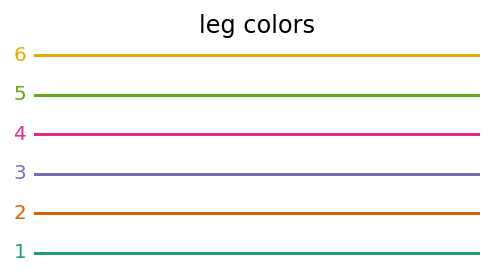

In [6]:
legColors = dict(zip(legList, plt.cm.Dark2.colors))

# lets also plot them to see if python understands what we wrote and if we like them
_, ax = plt.subplots(1,1,figsize = (4,len(legColors)/3))
for il,leg in enumerate(legColors):
    ax.axhline(il,color=legColors[leg])
    ax.text(0,il,leg+" ", va="center", ha="right", color=legColors[leg])
mf.mystyle_axes(ax)
ax.set_title("leg colors")


In [7]:
# variable of interest#
voi = "genotype"

In [8]:
data = data.sort_values([voi])

In [9]:
data[voi].unique()

array(['tg', 'wt'], dtype=object)

In [10]:
# Here you specify the order in which they appear
varList = ['wt', 'tg']

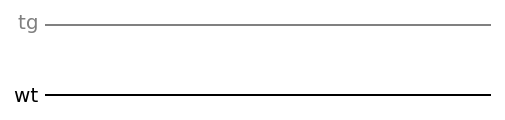

In [11]:
varColorCode = dict(zip(varList, ["black","Grey"]))
# lets also plot them to see if python understands what we wrote and if we like them
_, ax = plt.subplots(1,1,figsize = (4,len(varColorCode)/3))
for il,var in enumerate(varColorCode):
    ax.axhline(il,color=varColorCode[var],lw=2)
    ax.text(0,il,var+" ", va="center", ha="right", color=varColorCode[var])
mf.mystyle_axes(ax)

### Data preparation

/home/srdjan/github/Physio_Ca/islets/Regions.py:914: RuntimeWarning: Mean of empty slice.
  x = np.array([slow_est[d==i].mean() for i in irange])
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/srdjan/github/Physio_Ca/islets/Regions.py:939: RuntimeWarning: Mean of empty slice.
  x = np.array([slow_est[d==i].mean() for i in irange])
/home/srdjan/github/Physio_Ca/islets/Regions.py:914: RuntimeWarning: Mean of empty slice.
  x = np.array([slow_est[d==i].mean() for i in irange])
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/srdjan/github/Physio_Ca/islets/Regions.py:939: RuntimeWarning: Mean of empty slice.
  x = np.array([slow_est[d==i].mean() for i in irange])
/home/srdjan/github/Physio_Ca/islets/Regions.py:

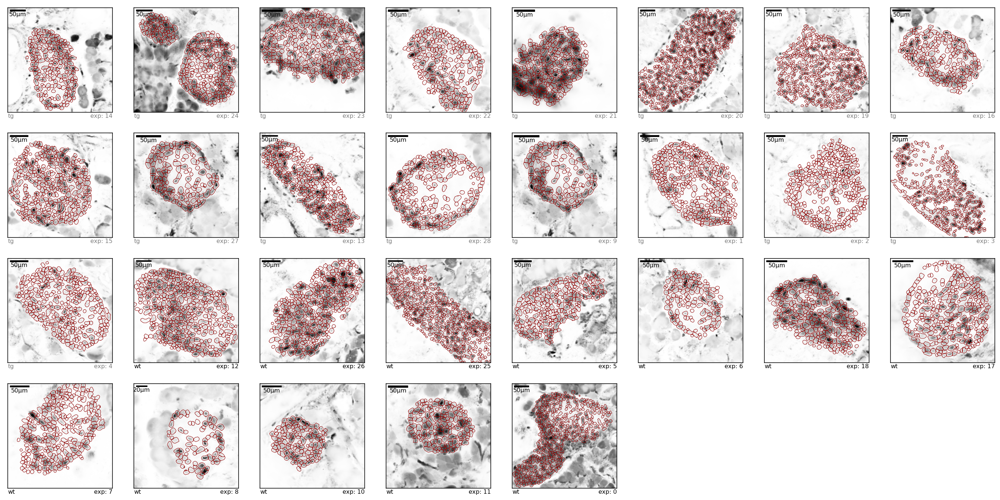

In [12]:
nc = 8
nr = int(np.ceil(len(data)/nc))
fig, axs = plt.subplots(nr,nc,figsize=(3*nc,3*nr))
ia = 0
for i in data.index:
    path = data.loc[i,"path"]
    ## here we load the regions if we didn't ye
    if "regions" in data.columns and isinstance(data.loc[i,"regions"], islets.Regions):
        regions = data.loc[i,"regions"]
    else:
        regions = islets.load_regions(path)
        data.loc[i,"regions"] = [regions]
    ## here we plot the regions
    ax = axs.flat[ia]
    regions.plotEdges(ax=ax, scaleFontSize=8)
    ia += 1
    ax.set_xticks([])
    ax.set_yticks([])
    var = data.loc[i,voi]
    ax.text(0,-.01,f"{var}",size=8,va="top",transform=ax.transAxes, color=varColorCode[var])
    ax.text(1,-.01,f"exp: {i}",size=8,va="top",transform=ax.transAxes, color=varColorCode[var],ha="right")
    
# remove unused axes
for ax in axs.flat[ia:]:
    ax.remove()

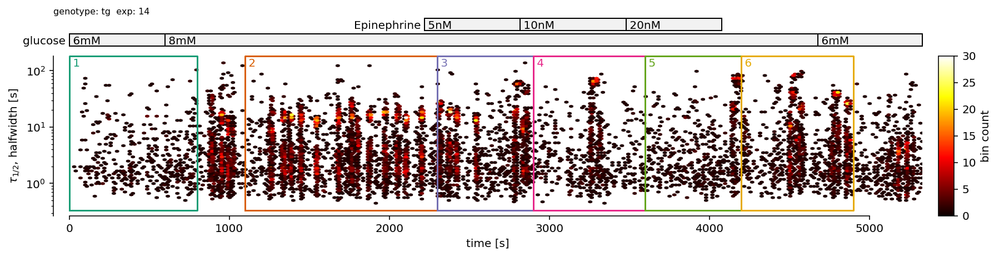

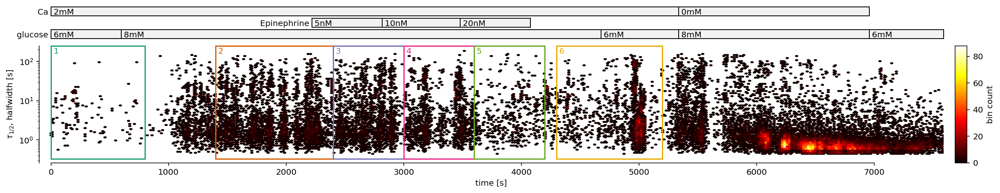

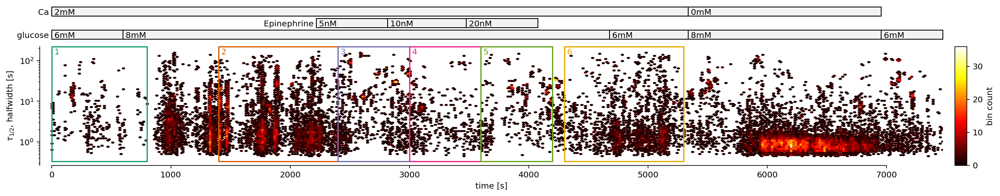

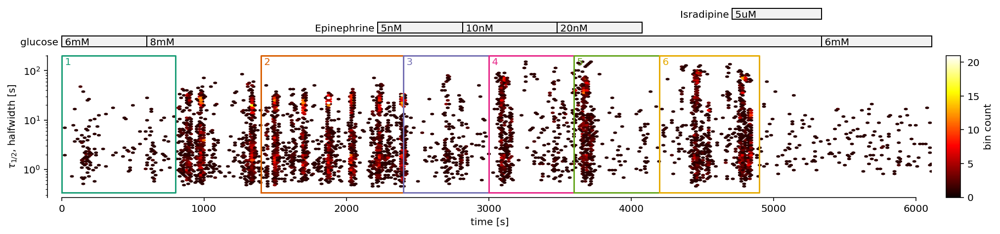

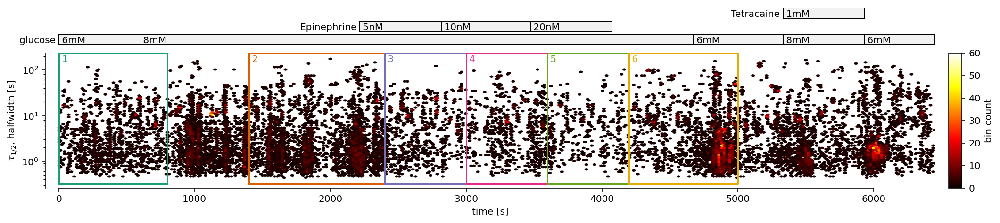

...

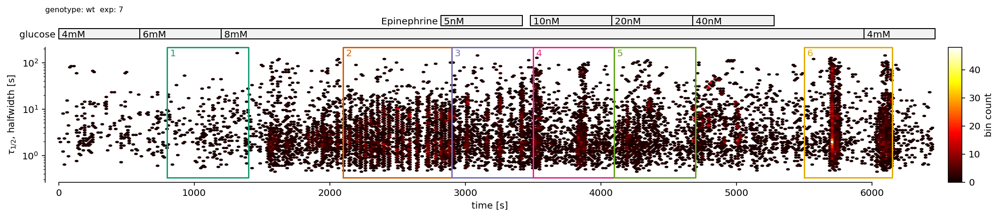

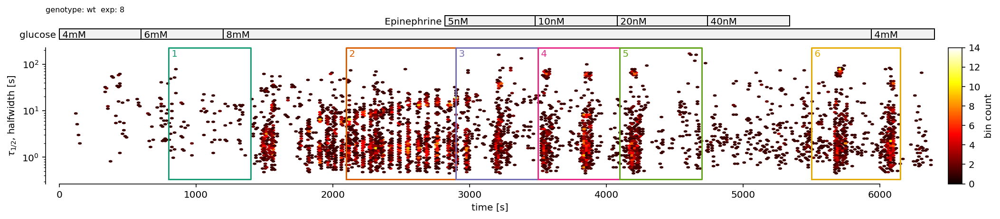

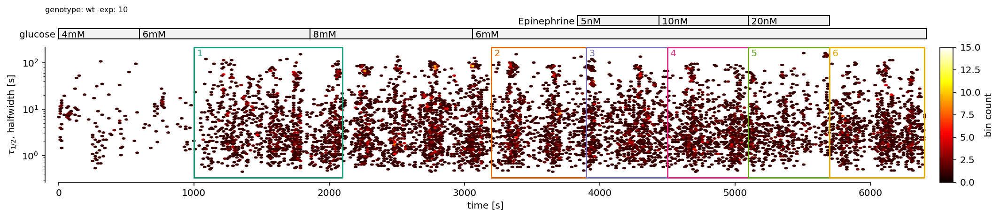

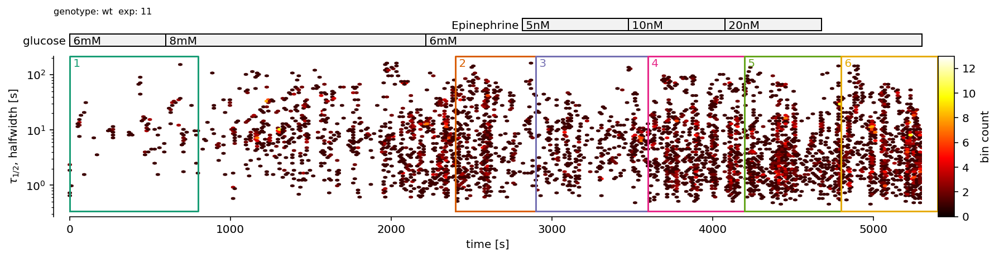

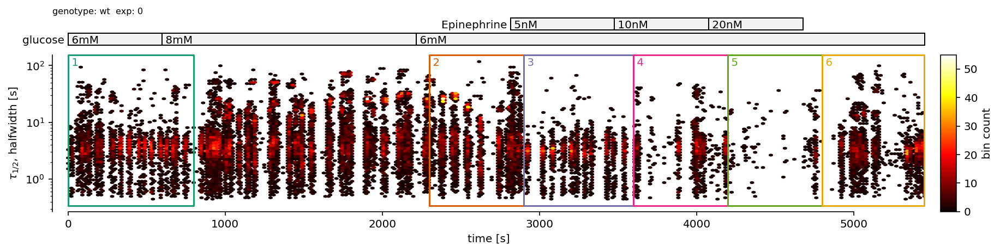

In [13]:
for i in data.index:
    # construct events_path from the roi path
    path = data.loc[i,"path"]
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    # regions are in our table now
    regions = data.loc[i,"regions"]
    # reading events each time from the file is very fast
    Events = pd.read_csv(events_path, index_col=0)
    # plot events
    fig, axs = mf.plot_events(Events, regions)
    ax = axs[0]
    var = data.loc[i,voi]
    legs = data.loc[i,"legs"]
    ax.text(0,1.3,f"{voi}: {var}  exp: {i}",size=8,va="top",transform=ax.transAxes)
    for leg in legs:
        mf.emphasize_region(ax,legs[leg],ax.get_ylim(), color=legColors[leg])
        ax.text(legs[leg][0],ax.get_ylim()[1]*.9," "+leg,va="top",color=legColors[leg])
    ax.set_ylim(ax.get_ylim()[0]*.8,None)
    plt.show()
    

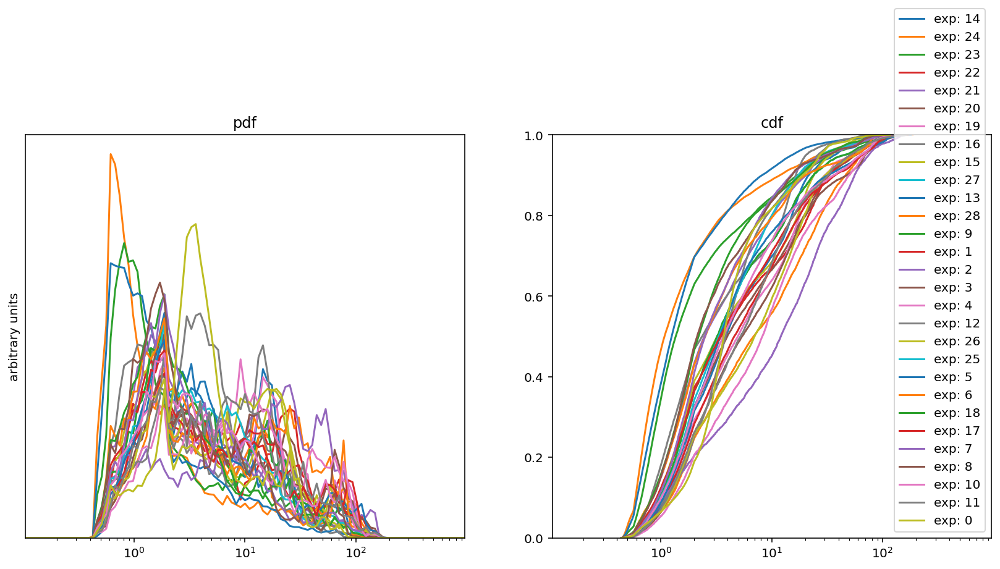

In [14]:
hwBinEdges = np.geomspace(start = .1, stop = 1000, num = 100)
hwBinCenters = np.sqrt( hwBinEdges[1:] * hwBinEdges[:-1])
fig, axs = plt.subplots(1,2,figsize=(14,6))
axs[0].set_title("pdf")
axs[1].set_title("cdf")
for ax in axs:
    ax.set_xscale("log")
for i in data.index:
    # construct events_path from the roi path
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    # reading events each time from the file is very fast
    Events = pd.read_csv(events_path, index_col=0)
    x = Events["halfwidth"].values.copy()
    h = np.histogram(x, hwBinEdges)[0]
    h = h/h.sum()
    axs[0].plot(hwBinCenters, h, label=f"exp: {i}")
    x.sort()
    axs[1].plot(x, np.linspace(0,1,len(x)), label=f"exp: {i}")
axs[0].set_ylim(0,)
axs[0].set_yticks([])
axs[0].set_ylabel("arbitrary units")
axs[1].set_ylim(0,1)
for ax in axs:
    ax.set_xlim(hwBinCenters[[0,-1]])
axs[1].legend(loc=4)

### Analysis

In [15]:
hwRegions = {
#    "ultrashort": (0.2,1.5),
    "short": (0.5,20),
#    "long":  (20,200),
}

In [16]:
# we again iterate over rows of data, this time collecting the important objects for each experiment:
allEpmpr = []
minEvents = 10
# ... 
for i in data.index:
    # ... import events, ...
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    Events = pd.read_csv(events_path, index_col=0)
    # define legs
    islets.EventDistillery.define_legs(Events, data.loc[i,"legs"])
    # ... calculate events per min per active roi, ...
    evpmpar = mf.get_events_per_min_per_nrois(  # <-- see Step3 for an explanation what this does
        Events,
        hwRegions,
        minEvents=minEvents,
        reduceRois=2,
        Nbootstrap=30
    )
    # ... we label result with the experiment index
    expLabel = "exp"+str(i)
    evpmpar["experiment"] = expLabel
    evpmpar[voi] = data.loc[i,voi]
    ## and collect it into the big list
    allEpmpr += [evpmpar]

There are 154 rois with more than 10 events (83%).
Out of them, 77 are sampled 30 times to estimate mean and std of the firing rate.
There are 225 rois with more than 10 events (85%).
Out of them, 112 are sampled 30 times to estimate mean and std of the firing rate.
There are 243 rois with more than 10 events (85%).
Out of them, 121 are sampled 30 times to estimate mean and std of the firing rate.
There are 141 rois with more than 10 events (76%).
Out of them, 70 are sampled 30 times to estimate mean and std of the firing rate.
There are 193 rois with more than 10 events (81%).
Out of them, 96 are sampled 30 times to estimate mean and std of the firing rate.
There are 245 rois with more than 10 events (67%).
Out of them, 122 are sampled 30 times to estimate mean and std of the firing rate.
There are 256 rois with more than 10 events (72%).
Out of them, 128 are sampled 30 times to estimate mean and std of the firing rate.
There are 128 rois with more than 10 events (75%).
Out of them, 6

In [17]:
allEpmpr = pd.concat(allEpmpr,ignore_index=True)

In [18]:
# check one by eye to make sure it makes sense
allEpmpr.query("experiment=='exp0'").sort_values(["genotype","leg"])

,hw_region,leg,epmpr,epmpr_std,experiment,genotype
163,short,1,1.205030,0.036263,exp0,wt
164,short,2,1.565816,0.063309,exp0,wt
165,short,3,0.953418,0.028830,exp0,wt
166,short,4,0.568208,0.022326,exp0,wt
167,short,5,0.098784,0.008396,exp0,wt
168,short,6,1.116668,0.035964,exp0,wt


In [19]:
# allEpmpr.to_csv("events_per_min_per_active_roi.csv")

In [20]:
#### Details
#mf.check_roi_heterogeneity(Events.query("halfwidth<20"),regions, boxplot_kwargs={"showfliers":False});

In [21]:
exps = list(allEpmpr["experiment"].unique())

In [22]:
jitter = .01 # how much you wish to stagger the points in the plot below
allEpmpr["plot_pos"] = allEpmpr["leg"].apply(lambda xi: legList.index(xi)) + allEpmpr["experiment"].apply(lambda xi: exps.index(xi)-(len(exps)-1)/2)*jitter

Text(0, -0.01, '*active rois are rois that have at least 10 events detected')

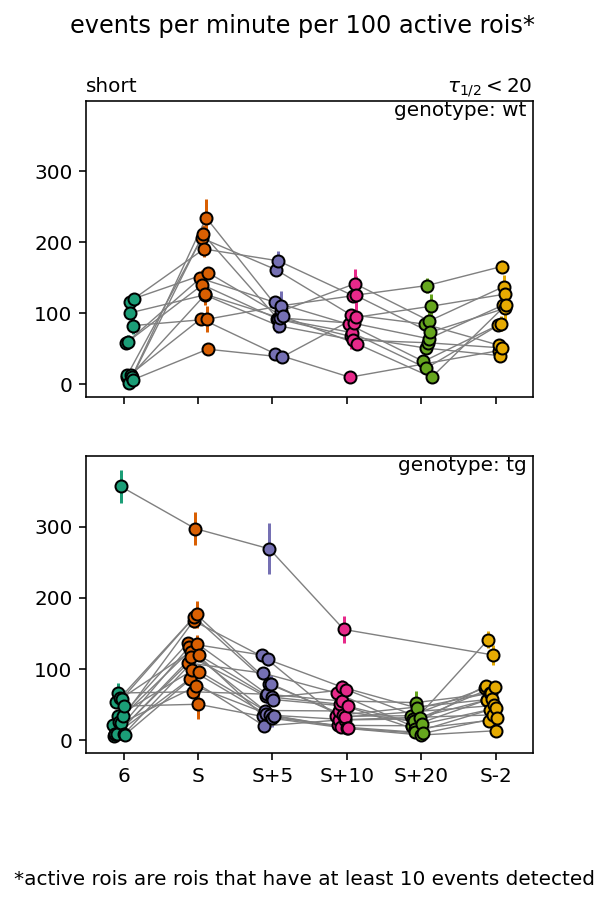

In [23]:
rescale = 100 # rescale to values you can change it if you wish
fig, axs = plt.subplots(len(varList),len(hwRegions),figsize=(1+len(hwRegions)*len(legColors)*.5,3*len(varList)), squeeze=False, sharex="col", sharey="col")
# plt.subplots_adjust(wspace=.5, top = 1-.2/axs.shape[1], bottom = .3/axs.shape[1])

if rescale>1:
    fig.suptitle(f"events per minute per {rescale} active rois*")
else:
    fig.suptitle(f"events per minute per active roi*\n")
legNames = ["6","S","S+5","S+10","S+20","S-2"]
for i_col,hwr in enumerate(hwRegions):
    for i_row,var in enumerate(varList):
        ax = axs[i_row, i_col]
        for exp,df in allEpmpr.query(f"hw_region=='{hwr}' and {voi}=='{var}'").groupby("experiment"):
            ax.plot(df['plot_pos'],rescale*df['epmpr'], color="grey",lw=.7)
        for leg in legs:
            df = allEpmpr.query(f"hw_region=='{hwr}' and {voi}=='{var}' and leg=='{leg}'").copy()
            ax.errorbar(df['plot_pos'],df["epmpr"]*rescale,df["epmpr_std"]*rescale,color=legColors[leg], marker="o",ls="none", mec="k")
        if i_row==0:
            ax.text(0,1.03,hwr, transform=ax.transAxes)
        ax.text(1,.95,f"{voi}: {var} ", transform=ax.transAxes,ha="right")
        ax.set_xlim(-.5,int(allEpmpr["plot_pos"].max())+.5)
#         ax.set_ylim(0,)

# set the ticks:
for ax in axs.flat:
    xmax = ax.get_xlim()[1]
    ax.set_xticks(np.arange(int(xmax)+1))
    ax.set_xticklabels(legNames, rotation=0)
ax = axs[0,0]
ax.text(1,1.03,r"$\tau_{1/2}<%g$"%hwRegions["short"][1],ha="right",transform=ax.transAxes)
fig.text(0,-.01,f"*active rois are rois that have at least {minEvents} events detected",va="top", )

In [24]:
from tqdm.notebook import tqdm

In [25]:
# we again iterate over rows of data, this time collecting the important objects for each experiment:
allHWs = []
minEvents = 10 # minimal number of events
               # in the concrete halfwidth domain and leg.
               # you may need to go down with this number 
               # especially for some 


for i in tqdm(data.index):
    # ... import events, ...
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    Events = pd.read_csv(events_path, index_col=0)
    # define legs
    legs = data.loc[i,"legs"]
    islets.EventDistillery.define_legs(Events, legs)
    Events = Events.dropna().copy()
    for hwr in hwRegions:
        hw0,hw1 = hwRegions[hwr]
        for leg in legList:
            evs = Events.query(f"halfwidth<{hw1} and halfwidth>={hw0} and leg=='{leg}'")
            x = [dfr["halfwidth"].median() for roi,dfr in evs.groupby("roi") if len(dfr)>minEvents] 
            allHWs += [{
                "experiment": "exp"+str(i),
                "leg": leg,
                voi: data.loc[i,voi],
                "halfwidth": np.mean(x),
                "halfwidth sem": np.std(x)/np.sqrt(len(x)-1),
                "hw_region": hwr,
                }]

  0%|          | 0/29 [00:00<?, ?it/s]

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in sqrt
/opt/tljh/user/env

In [26]:
allHWs = pd.DataFrame(allHWs)

In [27]:
allHWs.query("experiment=='exp0'")

,experiment,leg,genotype,halfwidth,halfwidth sem,hw_region
168,exp0,1,wt,3.528363,0.058752,short
169,exp0,2,wt,3.767951,0.068134,short
170,exp0,3,wt,3.149763,0.046959,short
171,exp0,4,wt,3.451205,0.124492,short
172,exp0,5,wt,NaN,NaN,short
173,exp0,6,wt,3.246554,0.053565,short


In [28]:
jitter = .01 # how much you wish to stagger the points in the plot below
allHWs["plot_pos"] = allHWs["leg"].apply(lambda xi: legList.index(xi)) + allHWs["experiment"].apply(lambda xi: exps.index(xi)-(len(exps)-1)/2)*jitter

Text(0, -0.01, '*active rois are rois that have at least 10 events detected')

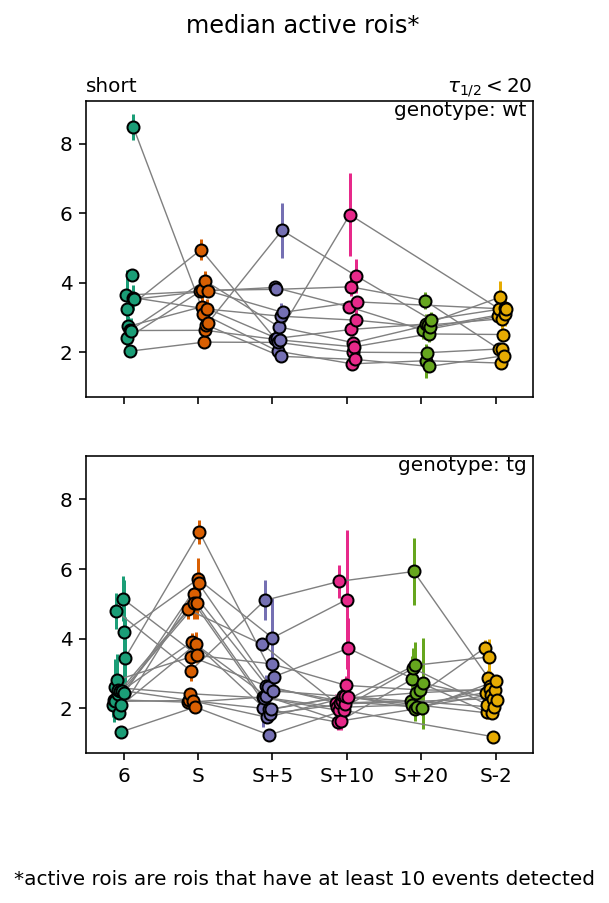

In [38]:
fig, axs = plt.subplots(len(varList),len(hwRegions),figsize=(1+len(hwRegions)*len(legColors)*.5,3*len(varList)), squeeze=False, sharex="col", sharey="col")
# plt.subplots_adjust(wspace=.5, top = 1-.2/axs.shape[1], bottom = .3/axs.shape[1])

fig.suptitle(f"median active rois*")

legNames = ["6","S","S+5","S+10","S+20","S-2"]
for i_col,hwr in enumerate(hwRegions):
    for i_row,var in enumerate(varList):
        ax = axs[i_row, i_col]
        for exp,df in allHWs.query(f"hw_region=='{hwr}' and {voi}=='{var}'").groupby("experiment"):
            df = df.copy().dropna()
            ax.plot(df['plot_pos'],df['halfwidth'], color="grey",lw=.7)
        for leg in legs:
            df = allHWs.query(f"hw_region=='{hwr}' and {voi}=='{var}' and leg=='{leg}'").copy()
            ax.errorbar(df['plot_pos'], df["halfwidth"], df["halfwidth sem"], color=legColors[leg], marker="o",ls="none", mec="k")
        if i_row==0:
            ax.text(0,1.03,hwr, transform=ax.transAxes)
        ax.text(1,.95,f"{voi}: {var} ", transform=ax.transAxes,ha="right")
        ax.set_xlim(-.5,int(allHWs["plot_pos"].max())+.5)
#         ax.set_ylim(0,)

# set the ticks:
for ax in axs.flat:
    xmax = ax.get_xlim()[1]
    ax.set_xticks(np.arange(int(xmax)+1))
    ax.set_xticklabels(legNames, rotation=0)
ax = axs[0,0]
ax.text(1,1.03,r"$\tau_{1/2}<%g$"%hwRegions["short"][1],ha="right",transform=ax.transAxes)
fig.text(0,-.01,f"*active rois are rois that have at least {minEvents} events detected",va="top", )